<a href="https://colab.research.google.com/github/AsadillahRamadhan/PCVK/blob/main/UASPrediksi.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import imutils
import cv2
from tensorflow.keras.models import load_model
from imutils.contours import sort_contours
from google.colab.patches import cv2_imshow

In [2]:
network = load_model('saved_model.pb')

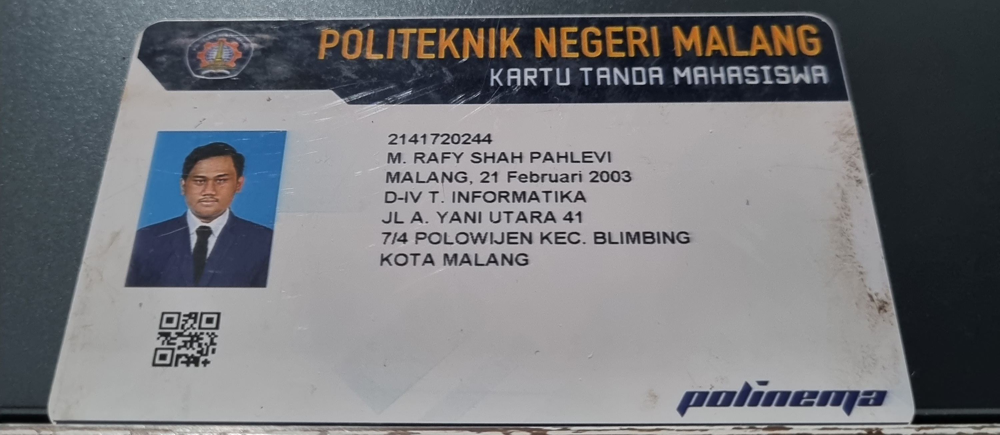

In [3]:
img = cv2.imread('/content/dataset_13.jpg')
cv2_imshow(img)

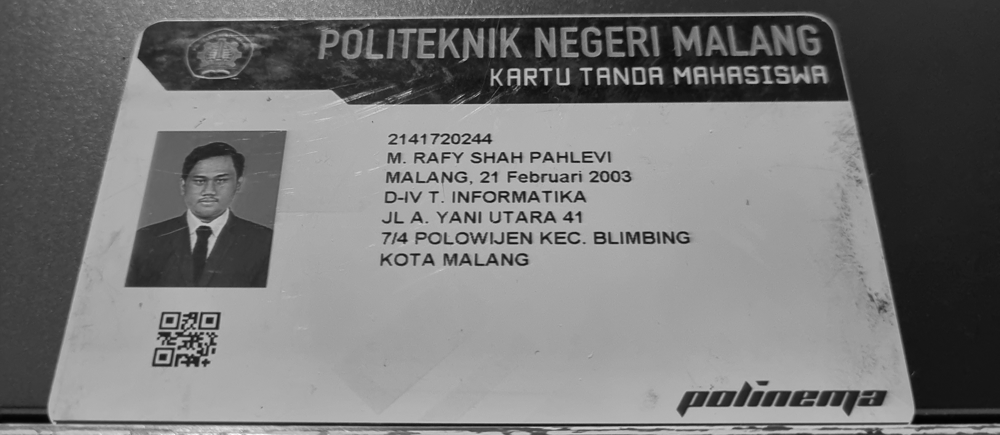

In [4]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)

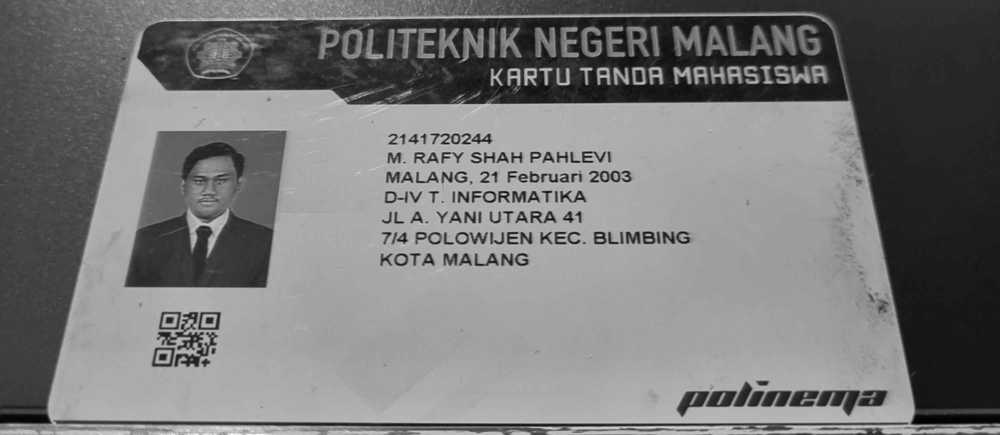

In [5]:
blur = cv2.GaussianBlur(gray, (3,3), 0)
cv2_imshow(blur)

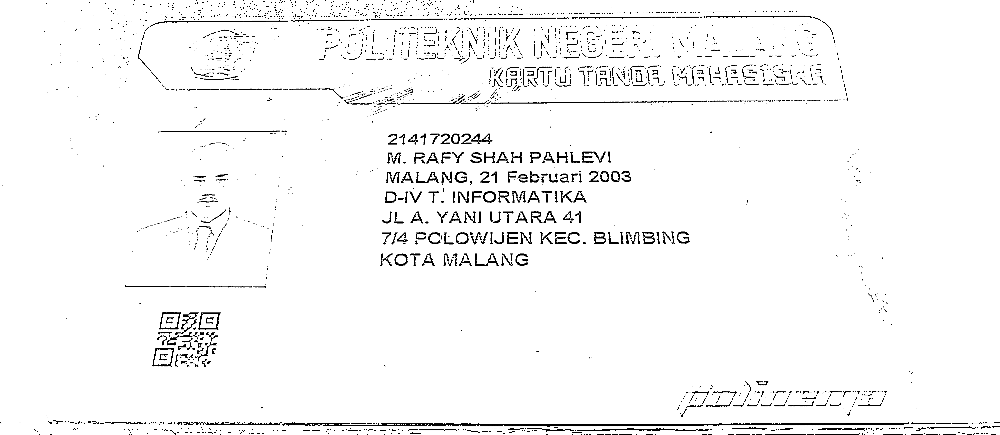

In [6]:
adaptive = cv2.adaptiveThreshold(blur, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 9)
cv2_imshow(adaptive)

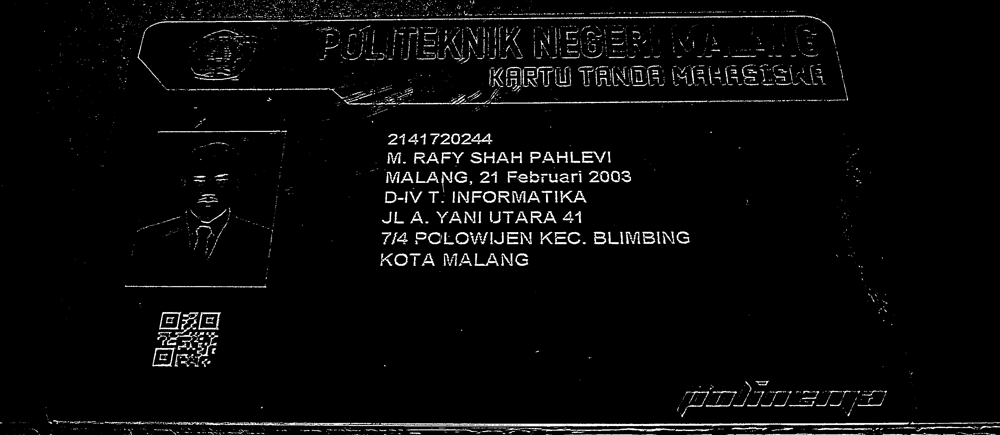

In [7]:
invertion = 255 - adaptive
cv2_imshow(invertion)

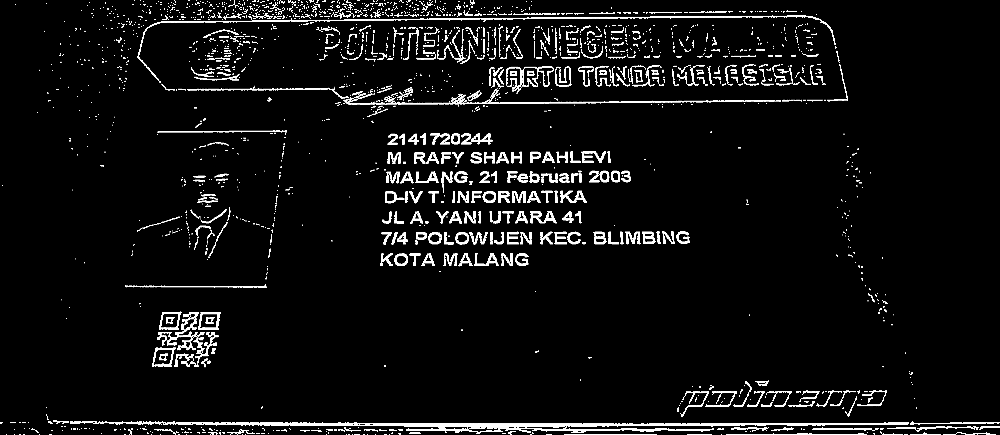

In [8]:
dilation = cv2.dilate(invertion, np.ones((3,3)))
cv2_imshow(dilation)

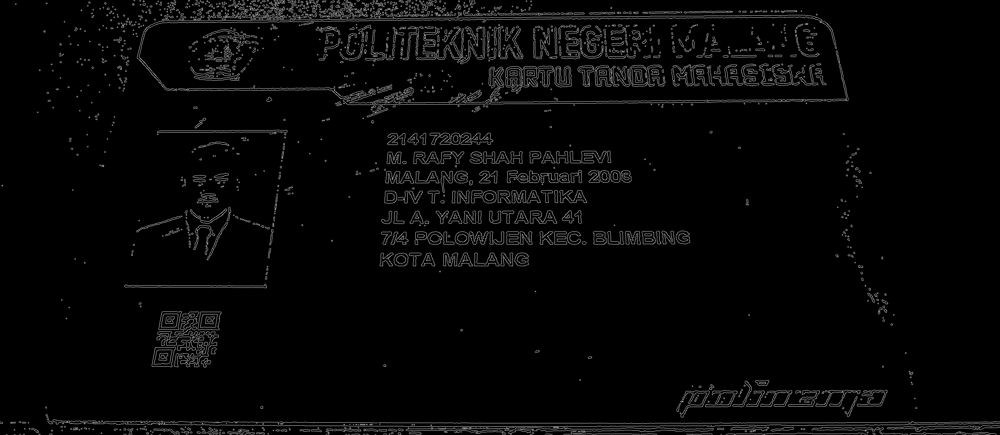

In [9]:
edges = cv2.Canny(dilation, 40, 150)
cv2_imshow(edges)

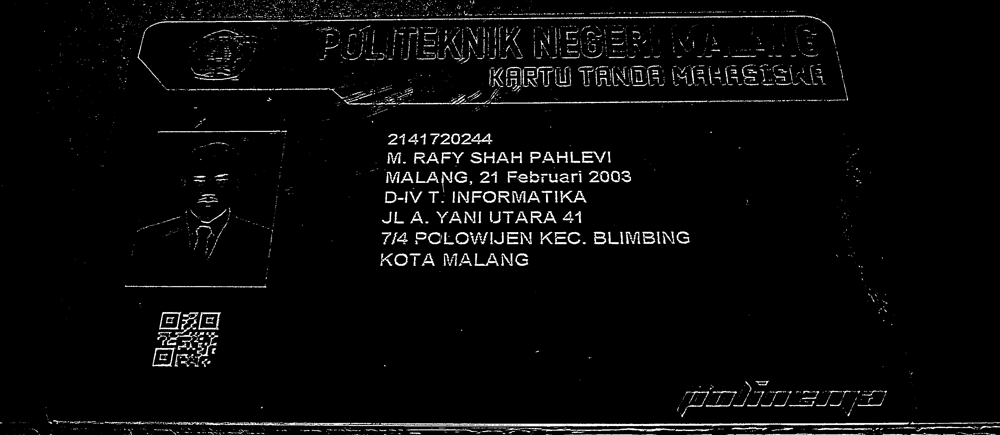

In [10]:
erode = cv2.erode(invertion, np.ones((1,1)))
cv2_imshow(erode)

In [11]:
def find_contours(img):
  conts = cv2.findContours(img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  conts = imutils.grab_contours(conts)
  conts = sort_contours(conts, method='left-to-right')[0]

  return conts

In [12]:
conts = find_contours(dilation.copy())

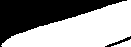

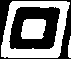

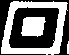

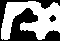

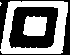

...

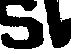

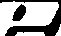

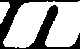

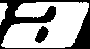

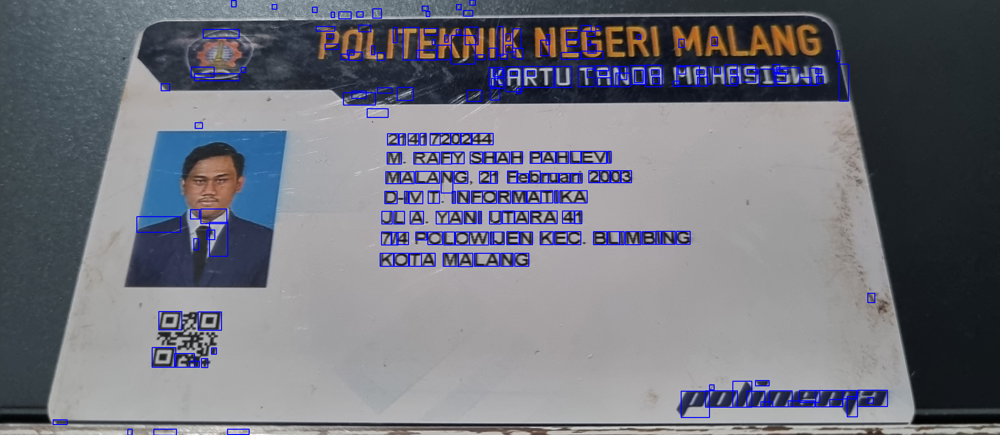

In [14]:
min_w, max_w = 10, 160
min_h, max_h = 14, 140
img_copy = img.copy()

for c in conts:
  (x, y, w, h) = cv2.boundingRect(c)
  if(w >= min_w and w <= max_w) and (h >= min_h and h <= max_h):
    roi = gray[y:y+h, x:x+w]
    thresh = cv2.threshold(roi, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
    cv2_imshow(thresh)
    cv2.rectangle(img_copy, (x,y), (x+w, y+h), (255,0,0), 2)

cv2_imshow(img_copy)

In [15]:
def extract_roi(img):
  roi = img[y:y+h, x:x+w]

  return roi

In [16]:
def thresholding(img):
  thresh = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
  return thresh

In [17]:
def resize_img(img, w, h):
  if w > h:
    resized = imutils.resize(img, width=28)
  else:
    resized = imutils.resize(img, height=28)

  (h, w) = resized.shape

  dX = int(max(0, 28 - w) / 2.0)
  dY = int(max(0, 28 - h) / 2.0)

  filled = cv2.copyMakeBorder(resized, top=dY, bottom=dY, right=dX, left=dX, borderType=cv2.BORDER_CONSTANT, value=(0,0,0))
  filled = cv2.resize(filled, (28,28))

  return filled

In [20]:
def normalization(img):
  img = img.astype('float32') / 255.0
  img = np.expand_dims(img, axis=-1)
  return img

In [22]:
def process_box(gray, x, y, w, h):

  roi = extract_roi(gray)
  thresh = thresholding(roi)
  (h, w) = thresh.shape
  resized = resize_img(thresh, w, h)

  cv2_imshow(resized)

  normalized = normalization(resized)

  return (normalized, (x, y, w, h))

In [23]:
detected_char = []

for c in conts:
  (x, y, w, h ) = cv2.boundingRect(c)

  min_w, max_w = 10, 160
  min_h, max_h = 14, 140

  if(w >= min_w and w <= max_w) and (h >= min_h and h <= max_h):
    detected_char.append(process_box(gray, x, y, w, h))

In [26]:
pixels = np.array([px[0] for px in detected_char], dtype='float32')

boxes = [box[1] for box in detected_char]

In [28]:
uppercase_alphabet = 'ABCDEFGHIJKLMNOPQRSTUVWXYZ'
lowercase_alphabet = 'abcdefghijklmnopqrstuvwxyz'
numbers = '0123456789'
symbols = '!\"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'
char_list = uppercase_alphabet + lowercase_alphabet + numbers + symbols
char_list = [ch for ch in char_list]

print(char_list)

['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z', 'a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o', 'p', 'q', 'r', 's', 't', 'u', 'v', 'w', 'x', 'y', 'z', '0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '!', '"', '#', '$', '%', '&', "'", '(', ')', '*', '+', ',', '-', '.', '/', ':', ';', '<', '=', '>', '?', '@', '[', '\\', ']', '^', '_', '`', '{', '|', '}', '~']


In [29]:
preds = network.predict(pixels)

8/8 [==============================] - 1s 42ms/step


(248, 94)

In [30]:
for p in preds:
  char_idx = np.argmax(p)
  print(char_list[char_idx], end = " ")

d S a d M c \ e _ 2 M L d D c x N > ; q 1 : { a E e d > V j U _ M V M M I b M L I M M 6 q G B " " P 3 k b ] W ` L a 1 T W 9 5 a " ( M M L a F M G ] 5 q L 2 f P j E " | G a ] O 2 1 c ] a 2 j a P " j ~ [ f f # I E a G 1 P ] d 7 b - 1 3 L j " G a L & ^ M j 5 c a n M M V e " ^ Q c a 4 L , j G a V v l " 6 ~ & 5 a ' b M 1 - e $ { M W V M < b & L Y 1 # M 5 e Y ' V P S 5 W R ] V 1 b ] c m 1 1 S " V ' U S ) V V ~ j I c 1 9 ~ f V R X ~ o a V c V ; " E - _ d j d f 4 e S _ > d j 7 e V k V ~ 6 e D G 5 ~ 

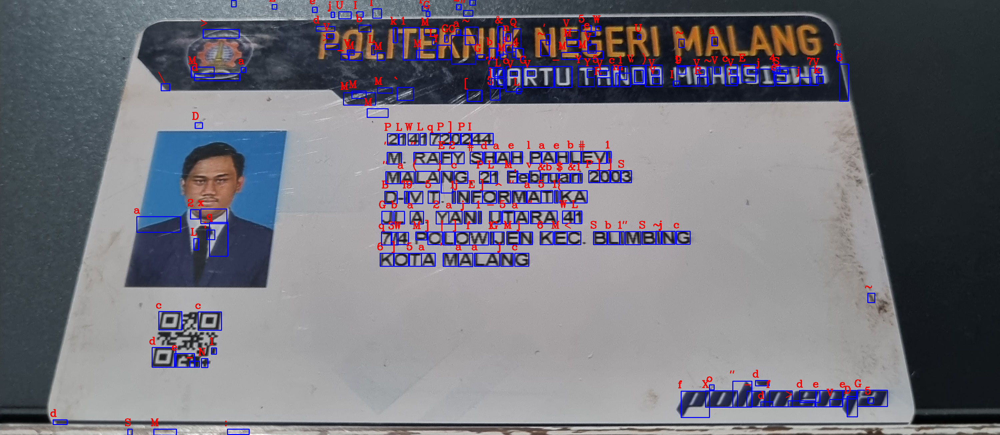

In [31]:
img_copy2 = img.copy()

for(pred, (x, y, w, h)) in zip(preds, boxes):
  i = np.argmax(pred)
  char_detected = char_list[i]

  cv2.rectangle(img_copy2, (x, y), (x+w, y+h), (255,0,0), 2)
  cv2.putText(img_copy2, char_detected, (x - 10, y - 10), cv2.FONT_HERSHEY_COMPLEX, 1, (0,0,255), 2)

cv2_imshow(img_copy2)